# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [ ]:
%pip install torch torchvision numpy matplotlib Pillow

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import os
import sys

from google.colab import drive
drive.mount('/content/drive')

os.chdir('/content/drive/MyDrive/Colab Notebooks/ML/Project')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" />
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" />
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [ ]:
import numpy as np

class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        pad, stride = self.padding, self.stride

        H_out = 1 + (H + 2 * pad - HH) // stride
        W_out = 1 + (W + 2 * pad - WW) // stride

        x_pad = np.pad(x, ((0,), (0,), (pad,), (pad,)), 'constant')
        out = np.zeros((N, F, H_out, W_out))

        for n in range(N):
            for f in range(F):
                for k in range(H_out):
                    for l in range(W_out):
                        h_start, h_end = k * stride, k * stride + HH
                        w_start, w_end = l * stride, l * stride + WW
                        out[n, f, k, l] = np.sum(x_pad[n, :, h_start:h_end, w_start:w_end] * w[f]) + b[f]

        self.cache = (x, w, b, x_pad, H_out, W_out)
        return out

    def backward(self, dout):
        x, w, b, x_padded, H_out, W_out = self.cache

        N, C, H, W = x.shape
        F, _, HH, WW = w.shape

        dw = np.zeros_like(w)
        db = np.zeros_like(b)
        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_out):
                    for j in range(W_out):
                        h_start, h_end = i * self.stride, i * self.stride + HH
                        w_start, w_end = j * self.stride, j * self.stride + WW

                        dw[f] += x_padded[n, :, h_start:h_end, w_start:w_end] * dout[n, f, i, j]
                        dx_padded[n, :, h_start:h_end, w_start:w_end] += w[f] * dout[n, f, i, j]
                        db[f] += dout[n, f, i, j]

        if self.padding > 0:
            dx = dx_padded[:, :, self.padding:-self.padding, self.padding:-self.padding]
        else:
            dx = dx_padded

        self.dx, self.dw, self.db = dx, dw, db
        return dx, dw, db

In [ ]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [ ]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [ ]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index

    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval

    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [ ]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(2,)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  1.0235882723299537e-09
dw error:  4.520676963036125e-10
db error:  7.368226509841581e-11


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [ ]:
from PIL import Image

first_img, second_img = Image.open("./Images/Sample/Sharif_1.JPG"), Image.open("./Images/Sample/Sharif_2.jpg")
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

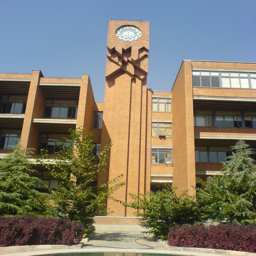

In [ ]:
first_img

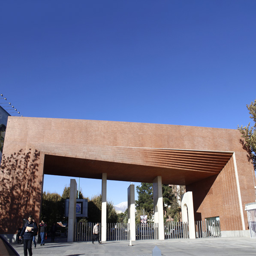

In [ ]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [ ]:
import numpy as np

img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

sobel_x = np.array([[[[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]]])
sobel_y = np.array([[[[-1, -2, -1], [0, 0, 0], [1, 2, 1]]]])
sobel_x = np.repeat(sobel_x, 3, axis=1)
sobel_y = np.repeat(sobel_y, 3, axis=1)

grayscale_r = np.array([[[[0, 0, 0], [0, 0.3, 0], [0, 0, 0]]]])
grayscale_g = np.array([[[[0, 0, 0], [0, 0.6, 0], [0, 0, 0]]]])
grayscale_b = np.array([[[[0, 0, 0], [0, 0.1, 0], [0, 0, 0]]]])
grayscale_combined = grayscale_r + grayscale_g + grayscale_b
grayscale_combined = np.repeat(grayscale_combined, 3, axis=1)

gaussian_blur = (1/16) * np.array([[[[1, 2, 1], [2, 4, 2], [1, 2, 1]]]])
gaussian_blur = np.repeat(gaussian_blur, 3, axis=1)

w = np.concatenate([sobel_x, sobel_y, grayscale_combined, gaussian_blur], axis=0)

b = np.array([0, 128, 128, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)

print(out)

[[[[ 1.365000e+03  2.000000e+01  6.000000e+00 ... -5.000000e+00
    -1.400000e+01 -1.331000e+03]
   [ 1.828000e+03  6.000000e+00  3.000000e+00 ... -9.000000e+00
    -1.200000e+01 -1.773000e+03]
   [ 1.837000e+03 -6.000000e+00 -2.000000e+00 ... -2.000000e+00
     0.000000e+00 -1.780000e+03]
   ...
   [ 2.226000e+03  1.000000e+00  4.000000e+00 ... -9.100000e+01
    -2.010000e+02 -2.041000e+03]
   [ 2.315000e+03  3.600000e+01  2.700000e+01 ... -1.700000e+01
    -7.100000e+01 -2.438000e+03]
   [ 1.829000e+03  5.400000e+01  3.200000e+01 ...  2.000000e+00
    -1.500000e+01 -1.871000e+03]]

  [[ 1.495000e+03  1.952000e+03  1.954000e+03 ...  1.901000e+03
     1.892000e+03  1.447000e+03]
   [ 1.620000e+02  1.540000e+02  1.350000e+02 ...  1.330000e+02
     1.400000e+02  1.450000e+02]
   [ 1.410000e+02  1.460000e+02  1.480000e+02 ...  1.400000e+02
     1.520000e+02  1.520000e+02]
   ...
   [ 1.340000e+02  1.570000e+02  1.820000e+02 ...  1.379000e+03
     1.501000e+03  1.233000e+03]
   [ 3.370000e

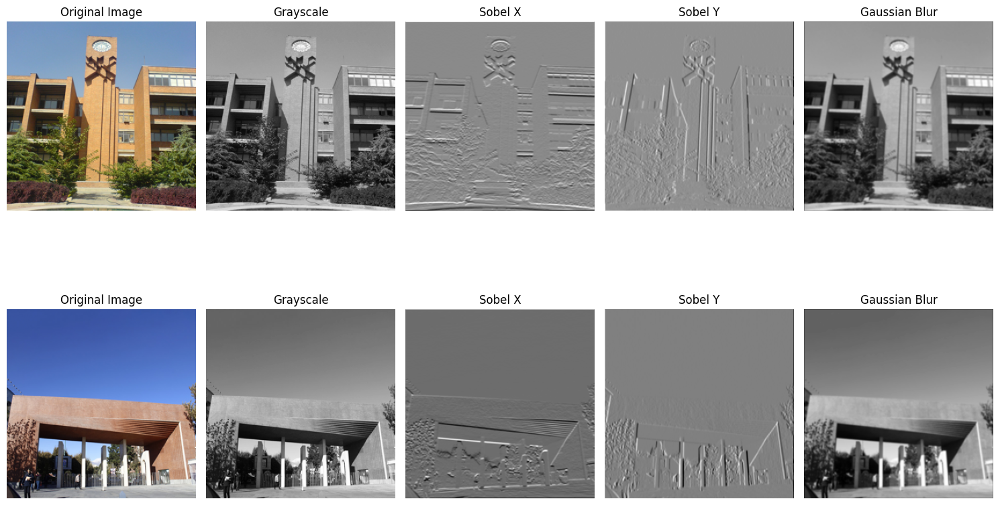

In [ ]:
import matplotlib.pyplot as plt

def plot_image(ax, img, title):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

sobel_y_output = out[:, 0]
sobel_x_output = out[:, 1]
grayscale_output = out[:, 2]
gaussian_blur_output = out[:, 3]


num_images = 2
fig, axes = plt.subplots(num_images, 5, figsize=(15, 5 * num_images))

for i in range(num_images):
    plot_image(axes[i, 0], x[i].transpose(1, 2, 0) / 255.0, 'Original Image')
    plot_image(axes[i, 1], grayscale_output[i], 'Grayscale')
    plot_image(axes[i, 2], sobel_x_output[i], 'Sobel X')
    plot_image(axes[i, 3], sobel_y_output[i], 'Sobel Y')
    plot_image(axes[i, 4], gaussian_blur_output[i], 'Gaussian Blur')

plt.tight_layout()
plt.show()

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [ ]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cuda')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [ ]:
img_size = 512 if not device == "cpu" else 256

transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), #values are from imageNet
])

In [ ]:
def load_image(image_path, transform):
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image

style_image_path = f"./Images/Neural_Transfer/style.jpeg"
content_image_path = f"./Images//Neural_Transfer/Content.jpeg"

style_image = load_image(style_image_path, transform).to(device, torch.float)
content_image = load_image(content_image_path, transform).to(device, torch.float)
print(style_image.size(), content_image.size())

torch.Size([1, 3, 512, 512]) torch.Size([1, 3, 512, 512])


Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [ ]:
def imshow(tensor, title=None):
    unloader = transforms.ToPILImage()
    tensor = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
    )(tensor)
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    plt.title(title)

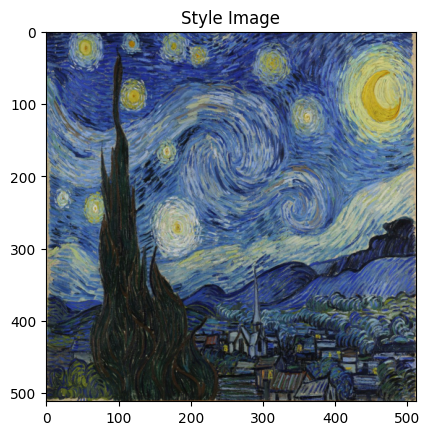

In [ ]:
imshow(style_image, "Style Image")

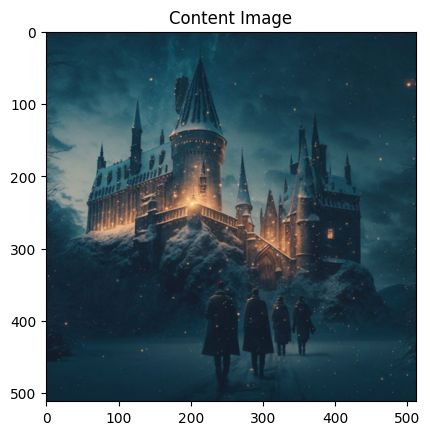

In [ ]:
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [ ]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [ ]:
vgg_model = vgg19(weights=VGG19_Weights.DEFAULT)
vgg_model_features = vgg_model.features
vgg_model_classifier = vgg_model.classifier

In [ ]:
import torchsummary
torchsummary.summary(vgg_model, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

VGG models, specifically VGG-16 and VGG-19, are convolutional neural network (CNN) architectures developed for image recognition tasks. These models are recognized for their simplicity and depth, utilizing small (3x3) convolution filters and deep architectures.

Common Uses of VGG Models:
1. VGG models are mainly used for image classification.
2. The convolutional layers of VGG models are frequently utilized to extract features from images.
3. They provide a foundation for other computer vision tasks. By adapting these models to new datasets, practitioners can capitalize on their robust feature extraction capabilities.

Feature Extraction:
These layers extract high-level features from input images. Convolutional layers identify patterns such as edges, textures, and shapes, while pooling layers reduce spatial dimensions and aggregate information.

Classification:
These layers take the high-level features extracted by the convolutional layers and utilize them to make final predictions. They map the extracted features to the output classes. The fully connected layers combine the learned features to determine the class probabilities for the input image. They employ ReLU activations and dropout to introduce non-linearity and prevent overfitting.

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

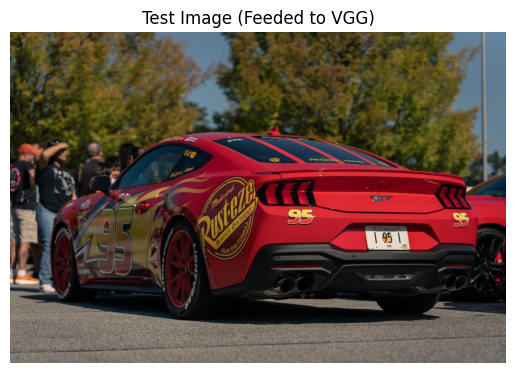

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model's classifier Prediction: 817


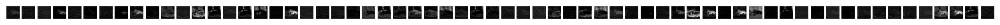

Model's classifier Prediction: 817


In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision import models
from PIL import Image
import matplotlib.pyplot as plt

vgg_test_image_path = "./Images/Neural_Transfer/Car.jpeg"
vgg_test_image = Image.open(vgg_test_image_path).convert('RGB')

plt.figure()
plt.imshow(vgg_test_image)
plt.title("Test Image (Feeded to VGG)")
plt.axis('off')
plt.show()

preprocess_vgg = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

vgg_test_image_tensor = preprocess_vgg(vgg_test_image).unsqueeze(0)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg_model = models.vgg16(pretrained=True).to(device)

vgg_model.eval()
with torch.no_grad():
    classifier_output = vgg_model(vgg_test_image_tensor.to(device))

_, predicted = classifier_output.max(1)
predicted_class_idx = predicted.item()

print(f"Model's classifier Prediction: {predicted_class_idx}")

class VGGFeatureExtractor(torch.nn.Module):
    def __init__(self, model):
        super(VGGFeatureExtractor, self).__init__()
        self.features = model.features
        self.avgpool = model.avgpool
        self.classifier = model.classifier

    def forward(self, x):
        feature_maps = []
        for layer in self.features:
            x = layer(x)
            if isinstance(layer, torch.nn.Conv2d):
                feature_maps.append(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x, feature_maps

vgg_feature_extractor = VGGFeatureExtractor(vgg_model).to(device)

with torch.no_grad():
    classifier_output, feature_maps = vgg_feature_extractor(vgg_test_image_tensor.to(device))

num_feature_maps = len(feature_maps[0][0])
fig, axes = plt.subplots(1, num_feature_maps, figsize=(20, 20))

for i in range(num_feature_maps):
    axes[i].imshow(feature_maps[0][0, i].cpu(), cmap='gray')
    axes[i].axis('off')

plt.show()

_, predicted = classifier_output.max(1)
predicted_class_idx = predicted.item()

print(f"Model's classifier Prediction: {predicted_class_idx}")

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [ ]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

# Get the class name
class_name = class_idx[predicted.item()]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

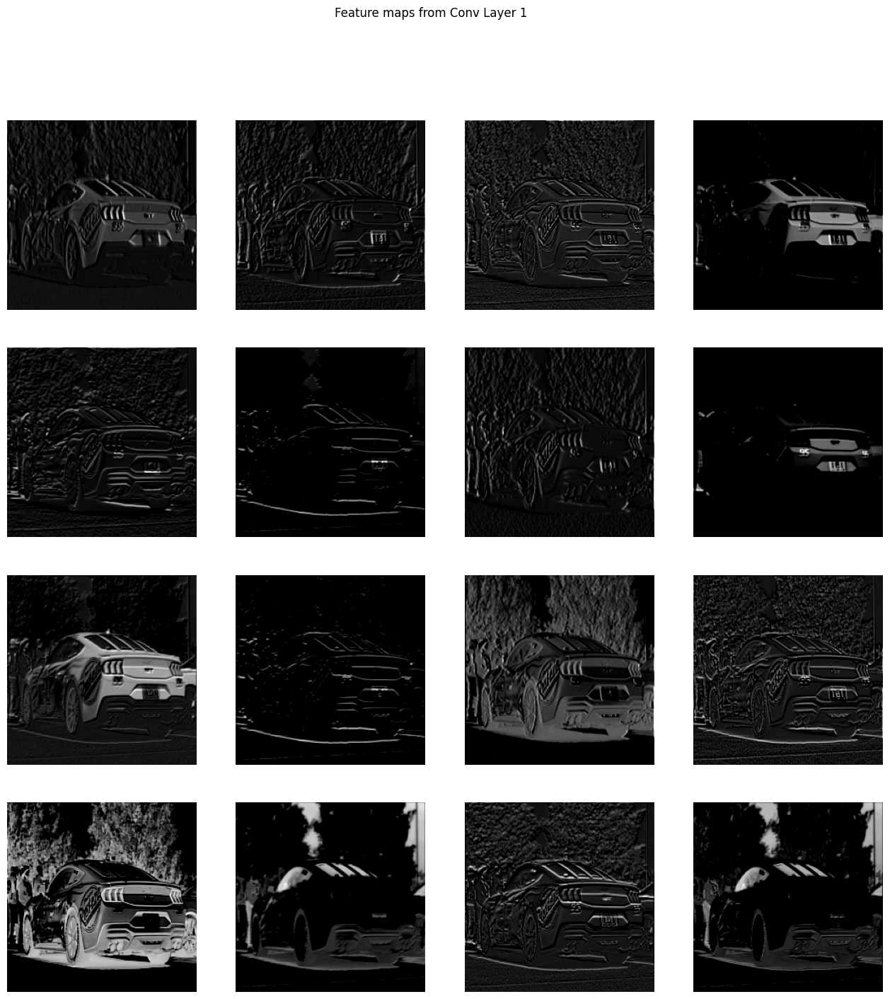

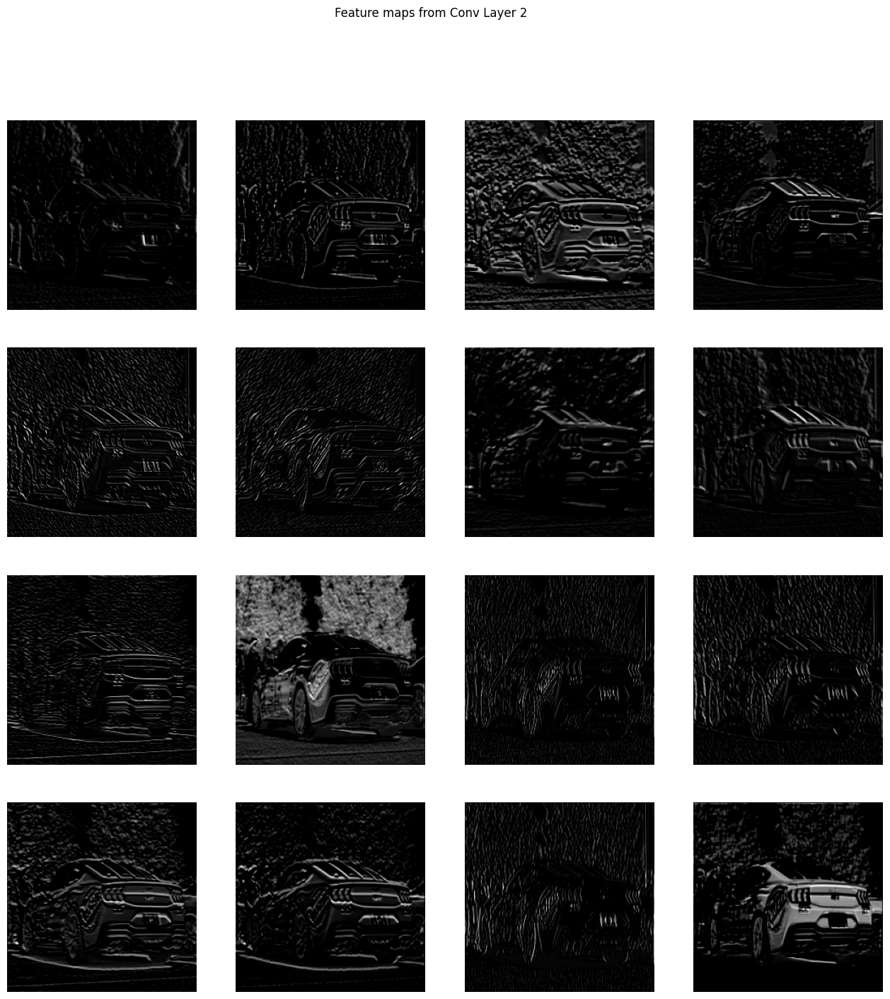

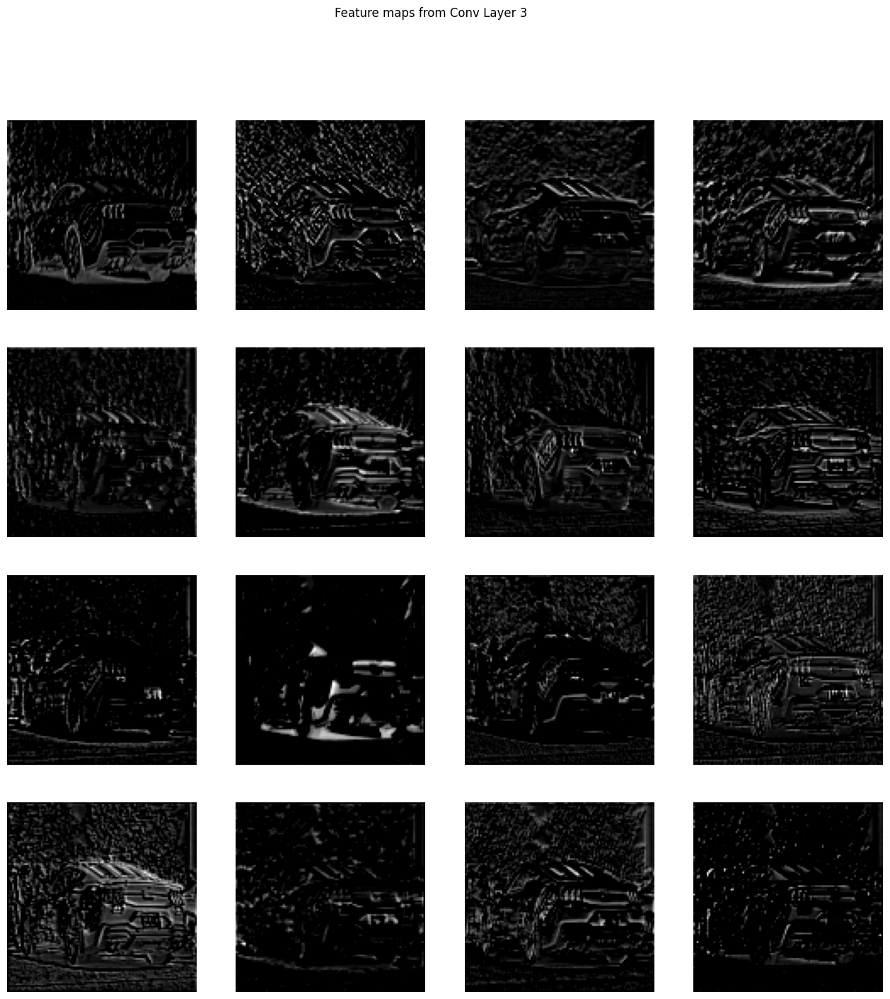

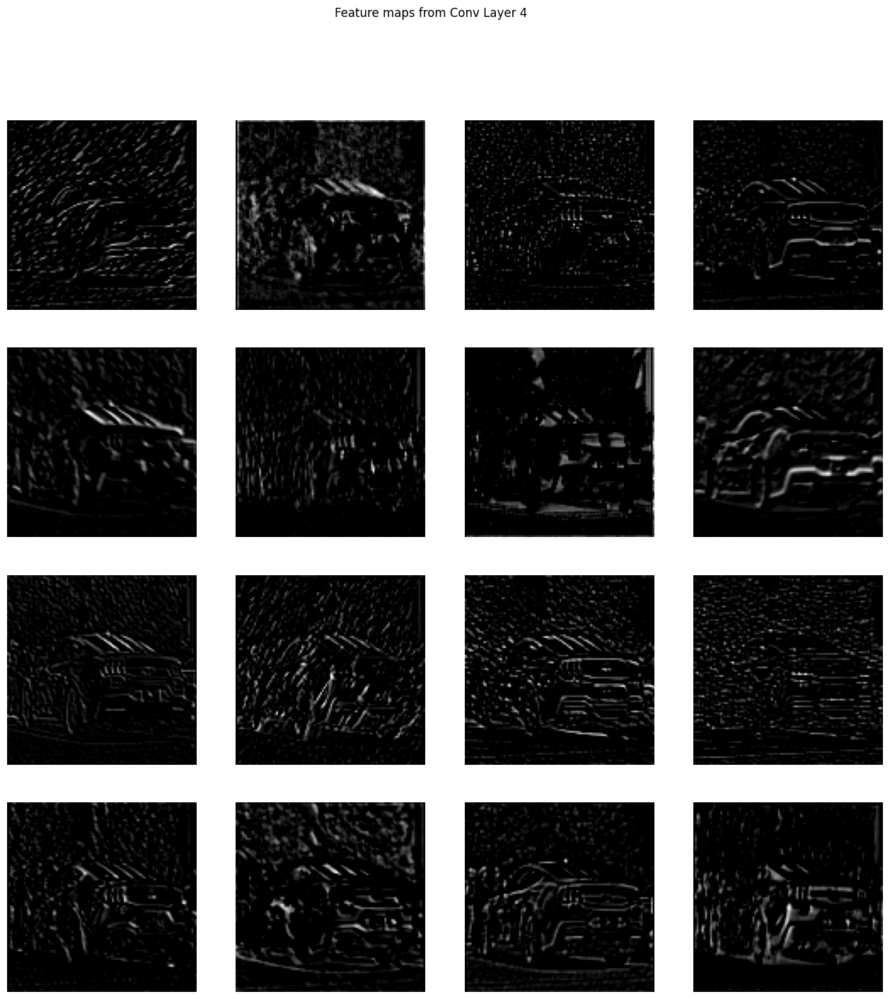

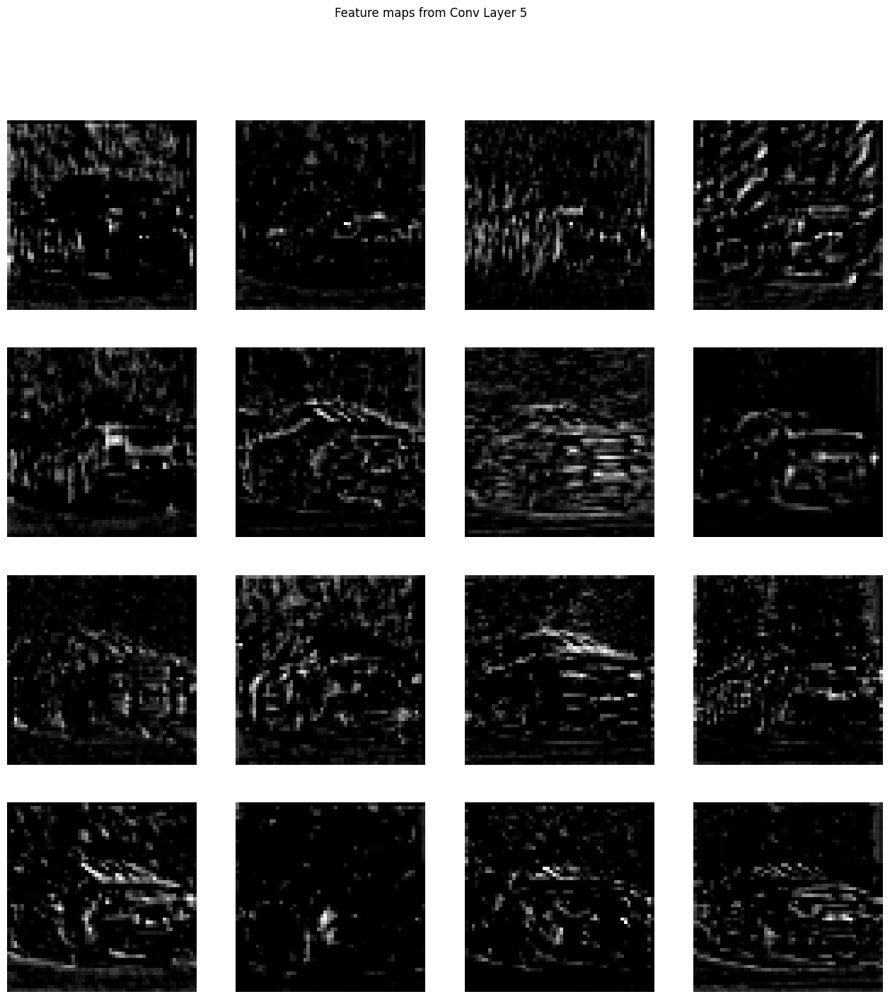

...

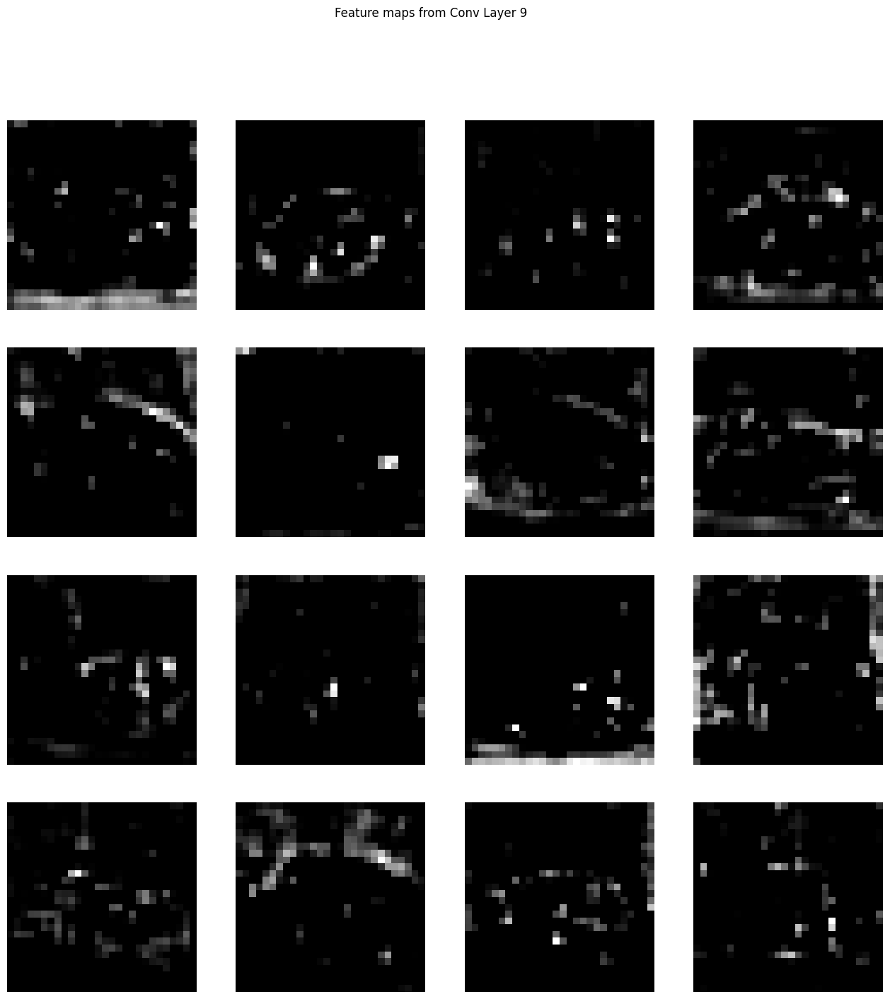

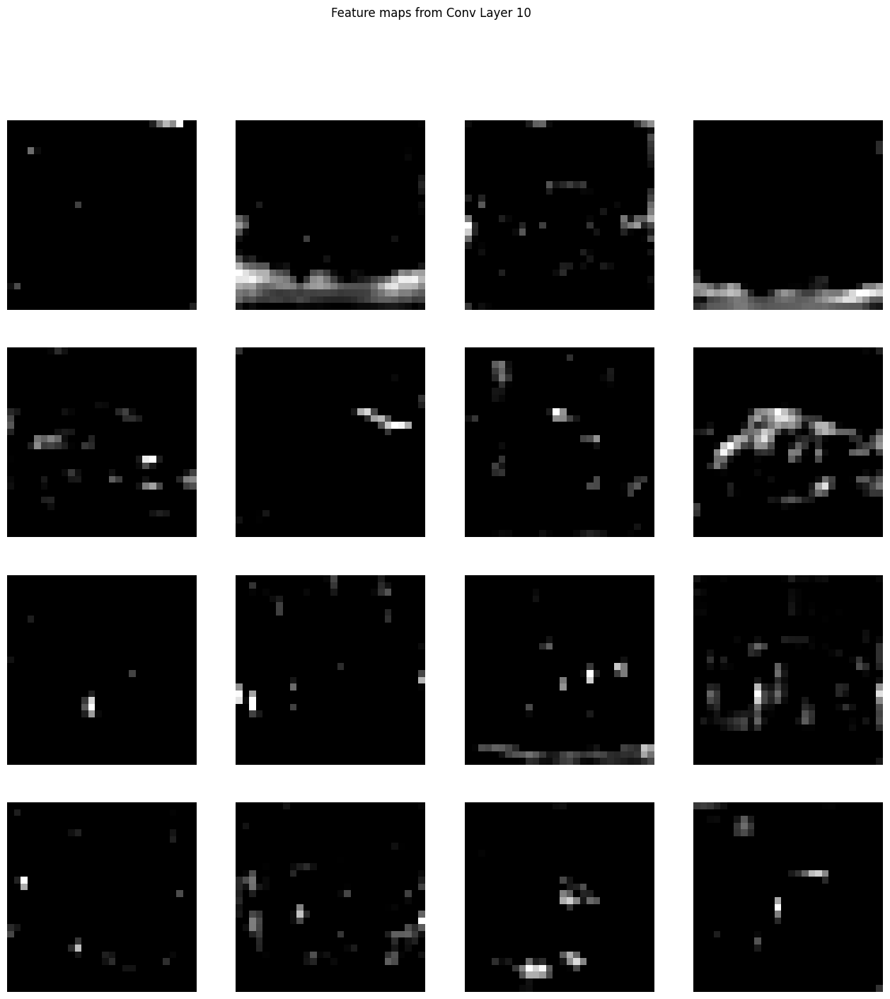

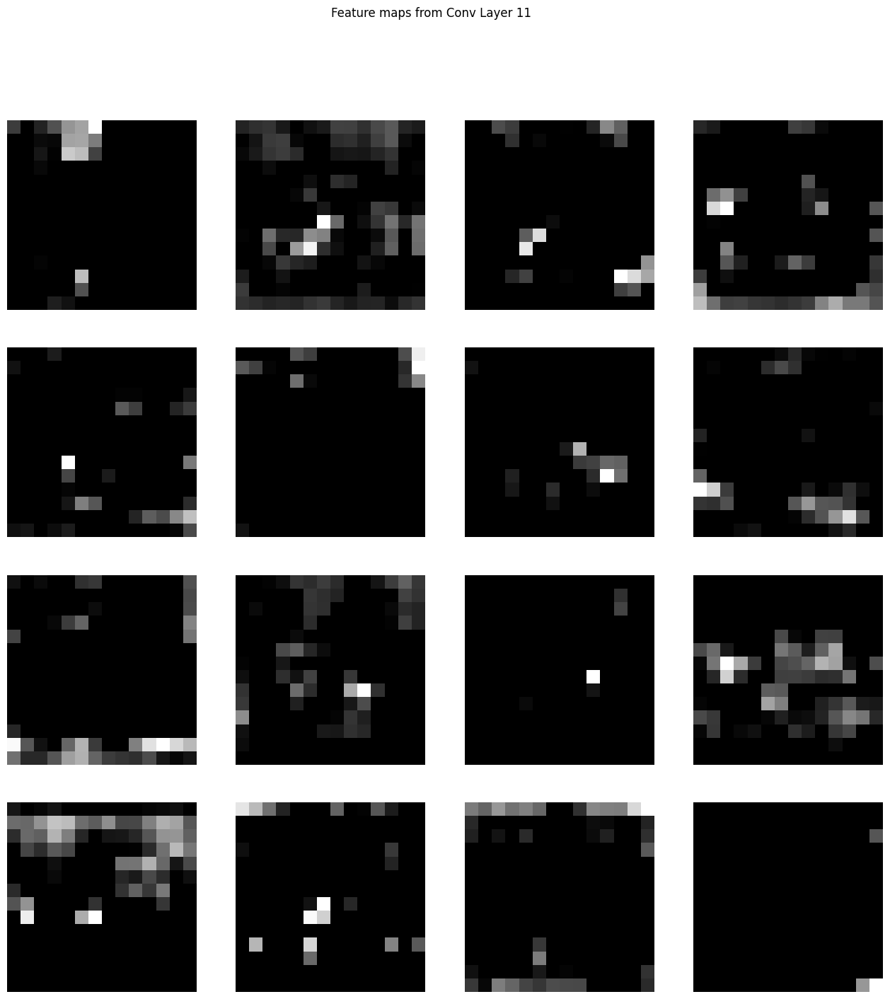

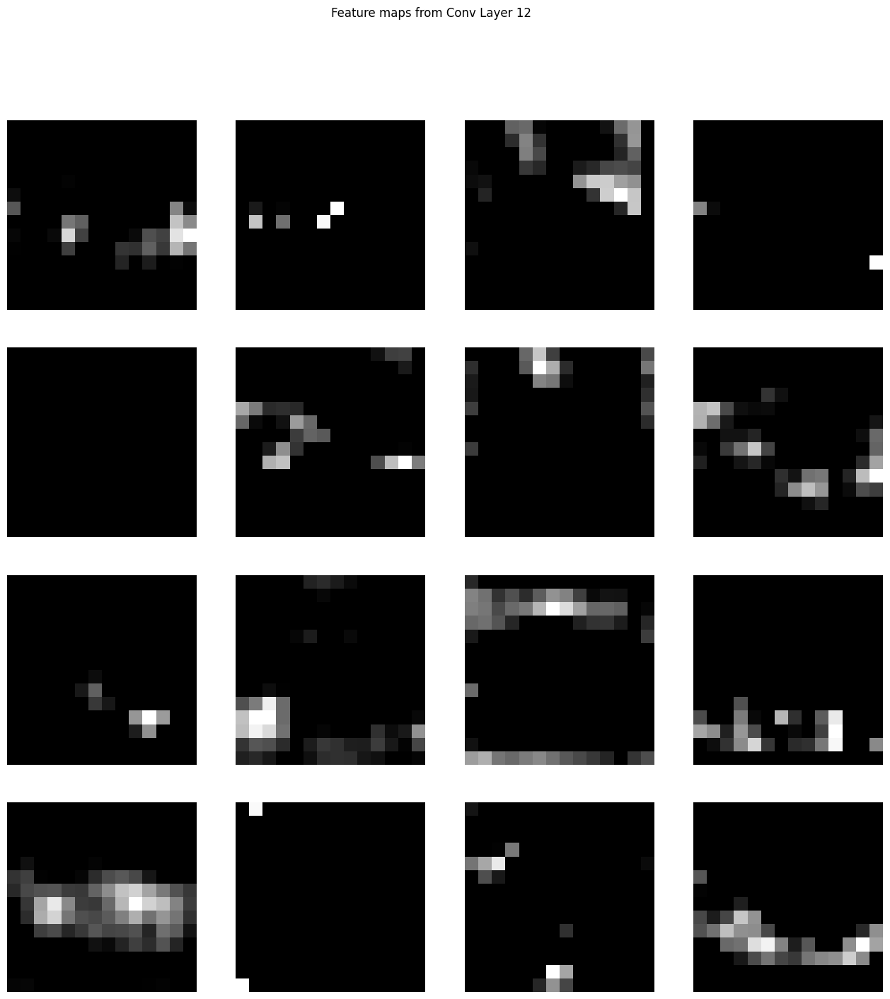

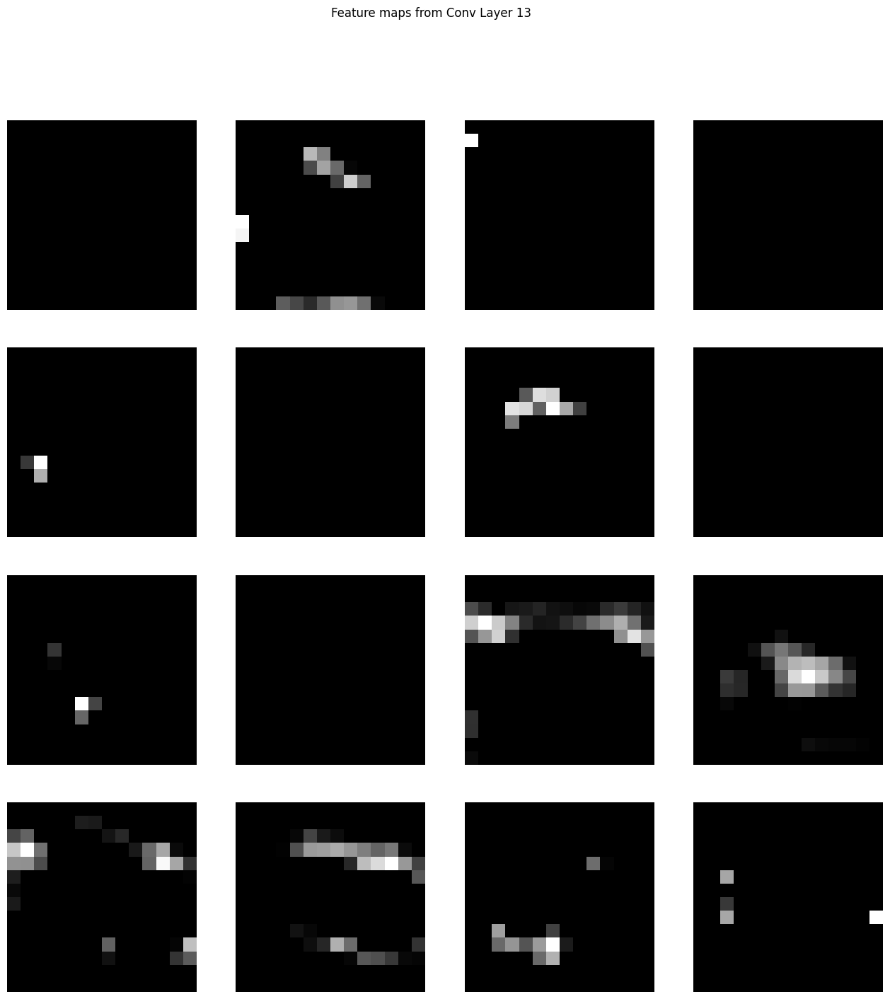

In [ ]:
# Extracting features from each Conv2D layer
vgg_model_features = vgg_model.features.to(device)
feature_maps = []

# Forward pass to get feature maps from each Conv2D layer
x = vgg_test_image_tensor.to(device)
for layer in vgg_model_features.children():
    x = layer(x)
    if isinstance(layer, nn.Conv2d):
        feature_maps.append(x)

# Visualize the first 16 feature maps of each Conv2D layer
for idx, fmap in enumerate(feature_maps):
    fmap = fmap[0, :16]  # Select the first 16 feature maps
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    fig.suptitle(f'Feature maps from Conv Layer {idx + 1}')
    for i in range(16):
        ax = axes[i // 4, i % 4]
        ax.imshow(fmap[i].cpu().detach().numpy(), cmap='gist_gray')
        ax.axis('off')
    plt.show()

# Predict the output of the VGG model for the test image
vgg_model.eval()
with torch.no_grad():
    classifier_output = vgg_model(vgg_test_image_tensor.to(device))

# Get the predicted class index
_, predicted = classifier_output.max(1)
predicted_class_idx = predicted.item()

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [ ]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [ ]:
def gram_calculator(input):
    batch_size, num_channels, height, width = input.size()
    features = input.view(batch_size * num_channels, height * width)
    gram_matrix = torch.mm(features, features.t())
    gram_matrix = gram_matrix / (batch_size * num_channels * height * width)
    return gram_matrix

In [ ]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_calculator(target_feature).detach()

    def forward(self, input):
        gram_matrix = gram_calculator(input)
        self.loss = F.mse_loss(gram_matrix, self.target)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [ ]:
cnn = vgg19(weights=VGG19_Weights.IMAGENET1K_V1).features.to(device).eval()

In [ ]:
cnn_normalization_mean = torch.tensor(
    [0.485, 0.456, 0.406]
)  # Normalization mean for the VGG19 model
cnn_normalization_std = torch.tensor(
    [0.229, 0.224, 0.225]
)  # Normalization std for the VGG19 model


class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().view(-1, 1, 1)
        self.std = std.clone().view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

content_layers_default = ['conv4']
style_layers_default = ['conv1', 'conv2', 'conv3', 'conv4', 'conv5']

def add_loss(cnn, style_img, content_img):
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    model = nn.Sequential(normalization)

    content_losses = []
    style_losses = []

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers_default:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers_default:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:i + 1]
    return model, content_losses, style_losses

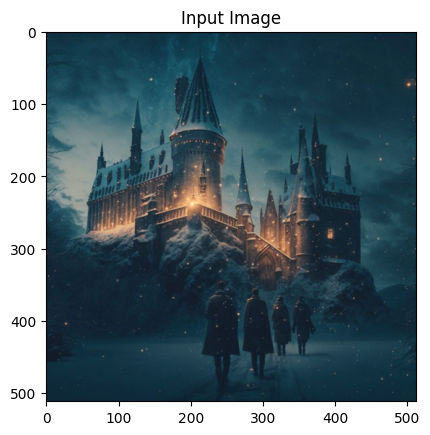

In [ ]:
imshow(content_image, "Input Image")

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

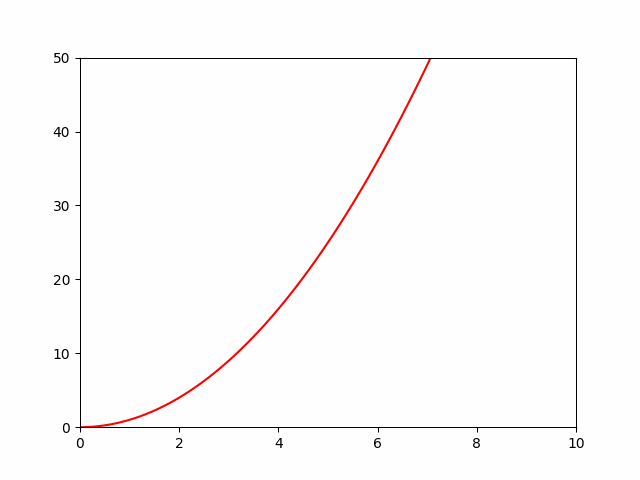

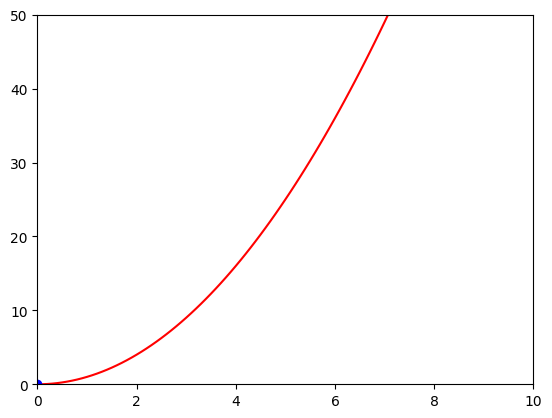

In [ ]:
import torch
import torch.optim as torch_optim
import matplotlib.pyplot as plt
import matplotlib.animation as plt_animation
from IPython.display import Image as IPImage, display, HTML
import random


def quadratic_function(val):
    return val ** 2

def optimization_step():
    opt.zero_grad()
    computed_loss = quadratic_function(var)
    computed_loss.backward()
    var_history.append(var.item())
    return computed_loss

var = torch.tensor([random.uniform(5.0, 10.0)], requires_grad=True)
opt = torch_optim.LBFGS([var], lr=0.1, max_iter=15)
var_history = []

# Running the optimization loop
for _ in range(20):
    opt.step(optimization_step)

def initialize_animation():
    plot_line.set_data([], [])
    plot_dot.set_data([], [])
    return plot_line, plot_dot

def update_animation(frame):
    x_vals = [i / 10.0 for i in range(100)]
    y_vals = [quadratic_function(torch.tensor([xi])).item() for xi in x_vals]
    plot_line.set_data(x_vals, y_vals)
    plot_dot.set_data([var_history[frame]], [var_history[frame] ** 2])
    return plot_line, plot_dot


figure, axis = plt.subplots()
plot_line, = axis.plot([], [], 'r-')
plot_dot, = axis.plot([], [], 'bo')
axis.set_xlim(0, 10)
axis.set_ylim(0, 50)

animation_obj = plt_animation.FuncAnimation(figure, update_animation, frames=len(var_history), init_func=initialize_animation, blit=True)
animation_obj.save('opt_animation.gif', writer='pillow')
display(IPImage(filename='opt_animation.gif'))

(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)


iteration: 0
Style Loss : 4394.466796875
Content Loss: 0.0
Total: 4394.466796875


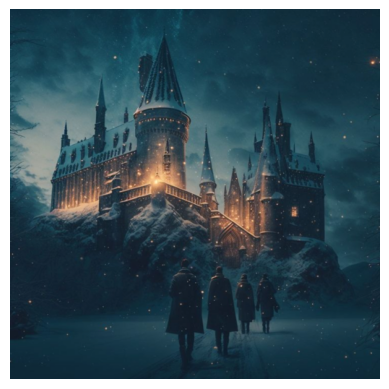


iteration: 50
Style Loss : 21.009639739990234
Content Loss: 20.85651969909668
Total: 41.86615753173828


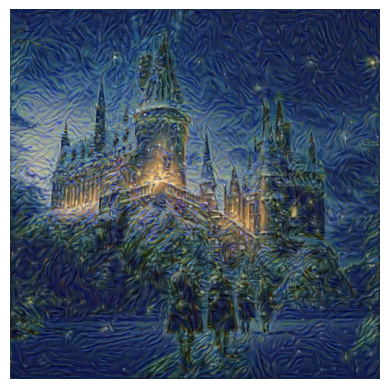


iteration: 100
Style Loss : 4.69796085357666
Content Loss: 17.290639877319336
Total: 21.988601684570312


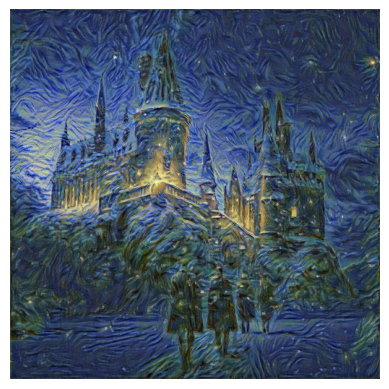


iteration: 150
Style Loss : 1.9428988695144653
Content Loss: 14.356292724609375
Total: 16.299192428588867


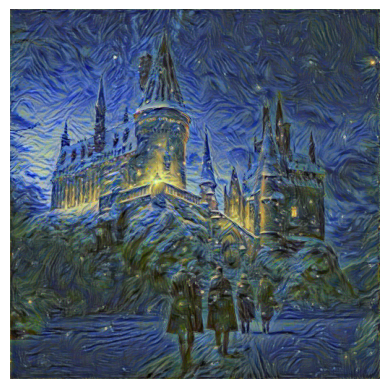


iteration: 200
Style Loss : 1.4420217275619507
Content Loss: 12.649824142456055
Total: 14.091845512390137


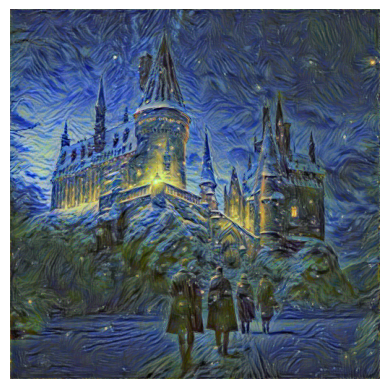


iteration: 250
Style Loss : 1.2461082935333252
Content Loss: 11.63663101196289
Total: 12.882739067077637


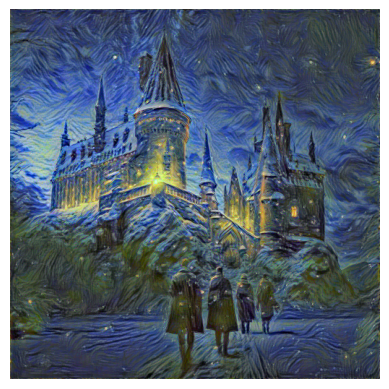


iteration: 300
Style Loss : 1.1166037321090698
Content Loss: 10.968912124633789
Total: 12.085515975952148


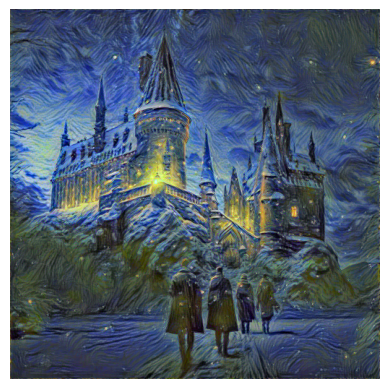


iteration: 350
Style Loss : 0.9939855337142944
Content Loss: 10.559144973754883
Total: 11.553130149841309


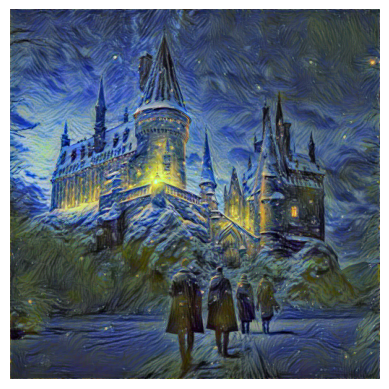


iteration: 400
Style Loss : 0.893030047416687
Content Loss: 10.299219131469727
Total: 11.192249298095703


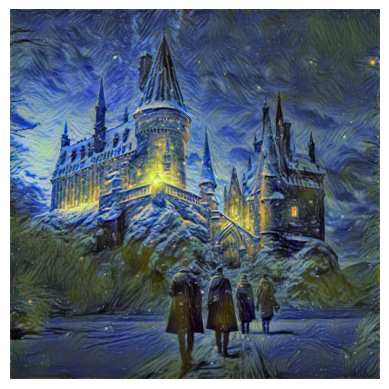


iteration: 450
Style Loss : 0.8067358732223511
Content Loss: 10.108037948608398
Total: 10.914773941040039


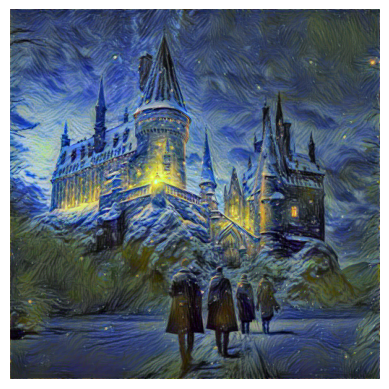


iteration: 500
Style Loss : 0.7353236079216003
Content Loss: 9.972009658813477
Total: 10.7073335647583


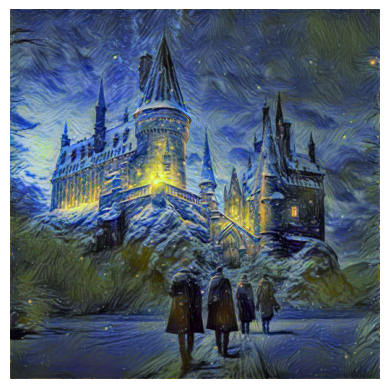


iteration: 550
Style Loss : 0.6817077994346619
Content Loss: 9.862770080566406
Total: 10.544477462768555


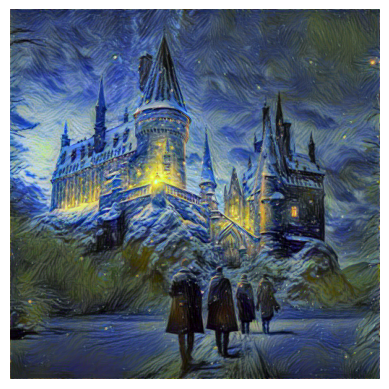


iteration: 600
Style Loss : 0.6376773118972778
Content Loss: 9.78384780883789
Total: 10.421525001525879


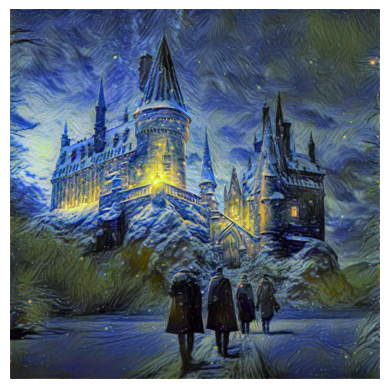


iteration: 650
Style Loss : 0.6096516251564026
Content Loss: 9.72327995300293
Total: 10.332931518554688


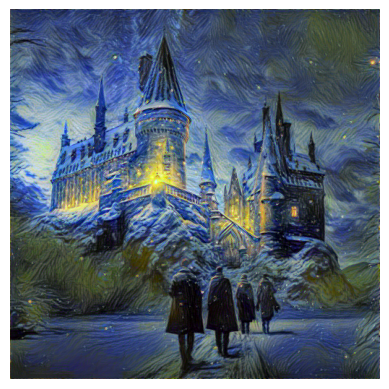


iteration: 700
Style Loss : 0.5883229970932007
Content Loss: 9.67237663269043
Total: 10.260699272155762


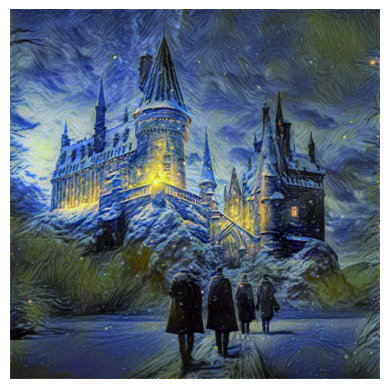


iteration: 750
Style Loss : 0.5740286111831665
Content Loss: 9.629609107971191
Total: 10.203638076782227


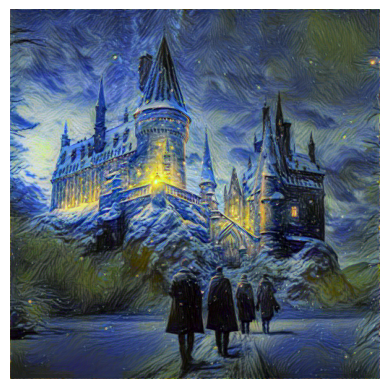


iteration: 800
Style Loss : 0.5641475319862366
Content Loss: 9.592254638671875
Total: 10.156402587890625


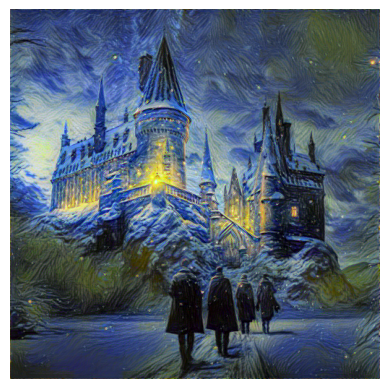


iteration: 850
Style Loss : 0.5555347800254822
Content Loss: 9.565258026123047
Total: 10.120792388916016


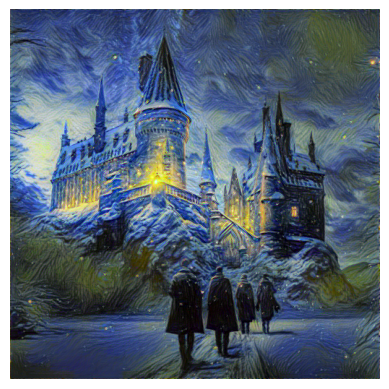


iteration: 900
Style Loss : 0.5496017932891846
Content Loss: 9.54321575164795
Total: 10.092817306518555


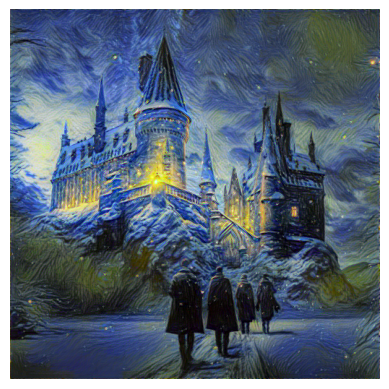


iteration: 950
Style Loss : 0.5462722182273865
Content Loss: 9.523110389709473
Total: 10.069382667541504


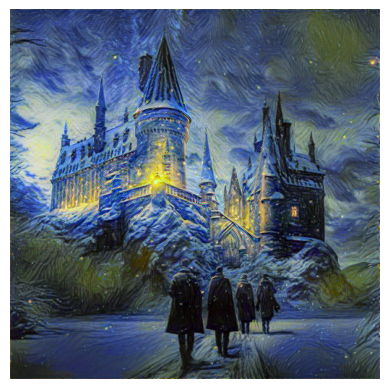

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
import matplotlib.pyplot as plt


def normalized_image_show(tensor, title=None):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")
    plt.grid(False)
    plt.pause(0.001)


alpha = 1
beta = 350000

input_image = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
    )(content_image).clone()
input_image.requires_grad_(True)

model, content_losses, style_losses = add_loss(
    cnn,
    transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
    )(style_image),
    transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
    )(content_image)
)


optimizer = optim.LBFGS([input_image])
num_iterations = 1000
iteration_counter = [0]
style_loss_list = []
content_loss_list = []
total_loss_list = []

while iteration_counter[0] < num_iterations:
    def closure():
        input_image.data.clamp_(0, 1)
        optimizer.zero_grad()
        model(input_image)
        style_score = torch.tensor(0.0, device=device)
        content_score = torch.tensor(0.0, device=device)

        for sl in style_losses:
            style_score += sl.loss
        for cl in content_losses:
            content_score += cl.loss

        style_score *= beta
        content_score *= alpha
        loss = style_score + content_score
        loss.backward()
        style_loss_list.append(style_score.item())
        content_loss_list.append(content_score.item())
        total_loss_list.append(loss.item())

        if iteration_counter[0] % 50 == 0:
            print()
            print(f"iteration: {iteration_counter[0]}")
            print(f"Style Loss : {style_score.item()}")
            print(f"Content Loss: {content_score.item()}")
            print(f"Total: {loss.item()}")
            plt.figure()
            normalized_image_show(input_image)
        iteration_counter[0] += 1

        return loss


    optimizer.step(closure)

Now, let's see the result of optimization process on our `input_image`.

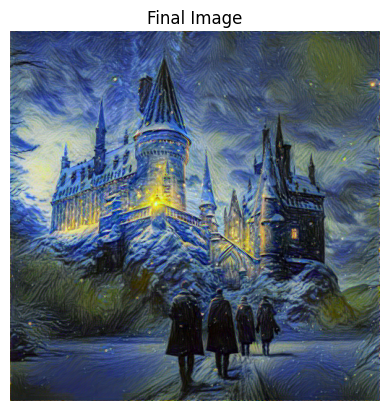

In [ ]:
input_image.data.clamp_(0, 1)
plt.figure()
normalized_image_show(input_image, title='Final Image')
plt.show()

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

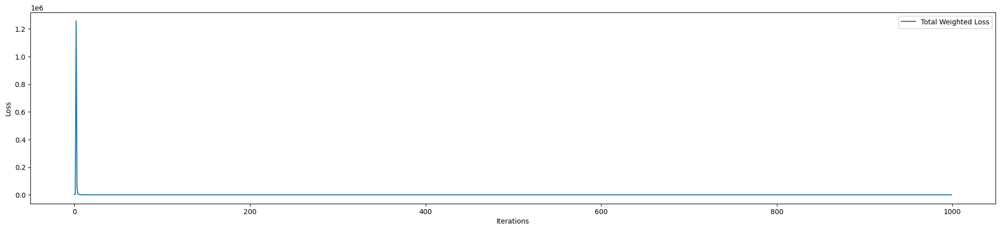

In [ ]:
plt.figure(figsize=(25, 5))
plt.plot(total_loss_list, label='Total Weighted Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

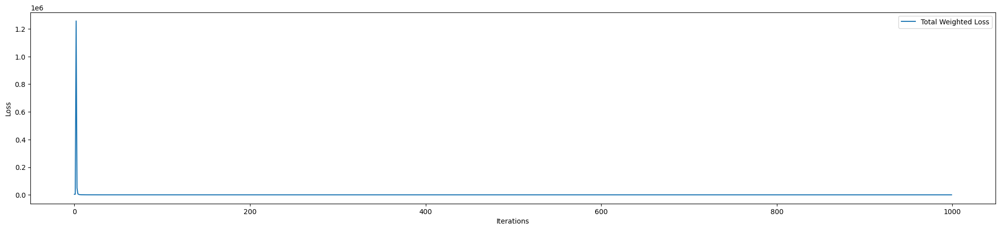

In [ ]:
plt.figure(figsize=(25, 5))
plt.plot(style_loss_list, label='Style Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

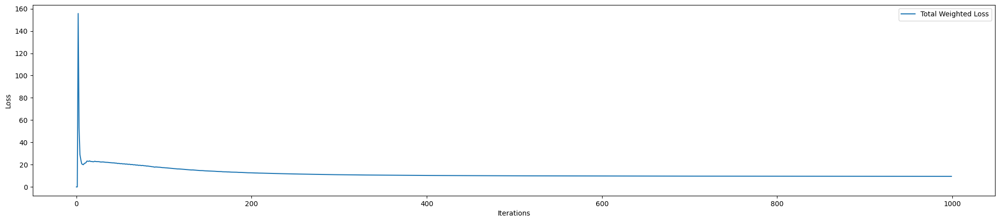

In [ ]:
plt.figure(figsize=(25, 5))
plt.plot(content_loss_list, label=Content Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()